# Introduction :

we have our jaguars dataset in form of a fifty one dataset.
in order to share this with the community , it is worth it if we upload it not only to fifty one website , but also to the hugging face  .
Later on it is planned to create a kaggle competetion using this dataset .

the dataset lives as of now in our google drive in this format :

* images / raw
* images / cropped body
* images / segmented body
* images / cropped Face
* images / segmented Face

the metadata is stored in a fifty one dataste with

* labels
* train / test / unkown / discarded

the train test splitting is done in another notebook with a selection rule:

1. similar images are found for each label (Jaguar ID)
2. if unique images are less than 5 , that jaguar is labeled as unknown otherwise:
3. clusters are sorted from least populated to most populated
4. 30% of the clusters are chosen for test data :
5. within the chosen clusters for test, one image is randomly selected and the rest are discarded .

(The test train splitting will not be a part of the published dataset)





## Create Hugging Face dataset



```
huggingface_dataset/
├── images/
│   ├── raw/
│   │   ├── 00000.jpg
│   │   ├── 00001.jpg
│   │   └── ...
│   ├── cropped/
│   │   └── ...
│   └── segmented/
│       └── ...
├── metadata_raw.json
├── metadata_cropped.json
├── metadata_segmented.json
└── README.md
```



## Create test set folder for kaggle


# import dataset


In [ ]:
!pip install fiftyone
!pip install datasets huggingface_hub


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 81.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.9/110.9 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.4/112.4 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.8/74.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 43.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 943.0/943.0 kB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.6/139.6 kB 9.1 MB/s eta 0:00:0

In [ ]:
from pathlib import Path
import fiftyone as fo
from google.colab import drive
import pandas as pd

In [ ]:
# read dataset


# mount shahab
#drive.mount('/content/drive')
# mount davide
#drive.mount('/gdrive')

project_path = {"shahab" : Path("/content/drive/MyDrive/DataScience/Jaguars_Project") ,
             "davide" : Path("/gdrive/MyDrive/DSR/Jaguars_Project/")}

drive.mount("/content/drive/")


user = "shahab"


Mounted at /content/drive/


In [ ]:
image_dir = project_path[user] / Path("images/cropped_body")
input_dir = project_path[user] / Path("datasets/version_16")

dataset = fo.Dataset.from_dir(
    dataset_dir=str(input_dir),
    dataset_type=fo.types.FiftyOneDataset,
    rel_dir=image_dir,
)

Importing samples...


INFO:fiftyone.utils.data.importers:Importing samples...


 100% |███████████████| 3598/3598 [1.0s elapsed, 0s remaining, 3.6K samples/s]         


INFO:eta.core.utils: 100% |███████████████| 3598/3598 [1.0s elapsed, 0s remaining, 3.6K samples/s]         


In [ ]:
dataset

Name:        2025.04.10.08.16.07
Media type:  image
Num samples: 3598
Persistent:  False
Tags:        []
Sample fields:
    id:                               fiftyone.core.fields.ObjectIdField
    filepath:                         fiftyone.core.fields.StringField
    tags:                             fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:                         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    created_at:                       fiftyone.core.fields.DateTimeField
    last_modified_at:                 fiftyone.core.fields.DateTimeField
    ground_truth:                     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Classification)
    prediction:                       fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    segmentations_body:               fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    bboxes_head:      

# get necessary information from the dataset .

In [ ]:
# get file path , groundtruth.label, and test_train_split for each entry in dataset
filepath = dataset.values("filepath")
# str(Path(*filepath[0].split("/")[-2:]))  #this makes a relative path like Ousado/P_Ousado_6.jpg
rel_filepath = [ str(Path(*p.split("/")[-2:])) for p in filepath] # get the last two directories
labels = [l.label for l in dataset.values("ground_truth")] # labels
test_train_split = dataset.values("testtrainsplit_cosine_similarity") # {None, 'eliminated', 'test', 'train', 'unknown'}


In [ ]:
df = pd.DataFrame({"filepath" : rel_filepath , "label" : labels , "test_train_split" : test_train_split})

In [ ]:
df.head()

,filepath,label,test_train_split
0,Ousado/P_Ousado_6.jpg,Ousado,train
1,Ousado/P_Ousado_5.jpg,Ousado,train
2,Ousado/P_Ousado_8.jpg,Ousado,train
3,Ousado/P_Ousado_12.jpg,Ousado,train
4,Ousado/P_Ousado_1.jpg,Ousado,train


# preparing the dataframe

In [ ]:
from sklearn.model_selection import train_test_split

def split_unknown_and_relabel(df, test_ratio=0.5, seed=42):
    """
    Splits 'unknown' into 'test' and remaining unknown.
    Sets label of test entries to 'unknown' and updates 'test_train_split'.
    """
    df = df.copy()

    unknown_df = df[df["test_train_split"] == "unknown"]
    non_unknown_df = df[df["test_train_split"] != "unknown"]

    if not unknown_df.empty:
        test_df, remaining_unknown_df = train_test_split(
            unknown_df, test_size=(1 - test_ratio), random_state=seed
        )

        test_df["test_train_split"] = "test"
        test_df["label"] = "unknown"

        df = pd.concat([non_unknown_df, remaining_unknown_df, test_df], ignore_index=True)

    return df


In [ ]:
def prepare_dataset_df(df, split="train"):
    """
    Filters the dataframe based on 'test_train_split'.
    Args:
        df: pandas DataFrame
        split: 'train' or 'test'
    Returns:
        Filtered DataFrame
    """
    return df[df["test_train_split"] == split].copy().reset_index(drop=True)

In [ ]:
df_hf = split_unknown_and_relabel(df , test_ratio=0.2)

In [ ]:
df_hf_train = prepare_dataset_df(df_hf, split="train")
df_hf_test = prepare_dataset_df(df_hf, split="test")

In [ ]:
# Now Create a copy function based on the dataframe :

# copy files from origin to their destination

# origin is : base folder + filepath  -> destination : base folder / filenumber.jpg

# then create the metadata json for the copy :

# import loging
import logging
from pathlib import Path
import pandas as pd

class create_HF_dataset :
  '''
  This class creates a HF dataset based on a dataframe.

  The dataframe should have the following columns :
  - filepath
  - label
  - test_train_split *optional
  - file_number *optional

  The class should get the following parameters :
  - base_folder
  - destination_folder

  This class then creates a hugging face dataset in several steps:

  1. filtering :
    the dataframe is fed to the class either filtered, or user can filter the dataframe themselves.
    This part is not implemented yet due the project limited time.

  3. create ordered numbers for all files in the dataframe to rename them.

  4. creates a dictionary of metadata for hugging face :

  [
  {
    "filename": "00000.jpg",
    "label": "Jaguar_01",
    }, ...
  ]

  5. creates a dictionary of files that need to be copied :
    [origin file path ]: [destination file path]



  '''

  def __init__(self, dataframe,base_folder, destination_folder):
    self.dataframe = dataframe
    self.base_folder = base_folder
    self.destination_folder = destination_folder
    print("file number was called")
    self.create_file_numbers()




  def filter_dataframe():
    raise NotImplementedError("This part is not implemented yet")

  def create_file_numbers(self, override = False):


    if "file_number" not in self.dataframe.columns :
      if override == False :
        self.dataframe = self.dataframe.reset_index()
        self.dataframe["file_number"] = self.dataframe.index.astype(str).str.zfill(5)
        logging.info("File numbers created")
    else :
      logging.info("File numbers already exist")



  def _create_metadata(self, df, label_col="label", file_col="file_number", extra_cols=None, file_ext=".jpg"):
    """
    Creates metadata from a dataframe dynamically.

    Parameters:
    - df: pandas.DataFrame
    - label_col: str, column name to use as label
    - file_col: str, column name used to construct the filename
    - extra_cols: list of str, other columns to include in the metadata
    - file_ext: str, file extension to add to the filename (default ".jpg")
    """
    if extra_cols is None:
        extra_cols = []

    def make_metadata_dict(row):
        meta = {
            "filename": f"{row[file_col]}{file_ext}",
            "label": row[label_col]
        }
        for col in extra_cols:
            meta[col] = row[col]
        return meta

    self.metadata = df.apply(make_metadata_dict, axis=1).tolist()
    logging.info("Metadata created with columns: %s", ["filename", "label"] + extra_cols)
    return self.metadata


  def _create_copy_dict(self):
    """
    creates a dictionary of files that need to be copied :
    [origin file path ]: [destination file path].jpg

    Note that the filename will be changed to the file_number.jpg

    """
    self.copy_dict = {}
    for index, row in self.dataframe.iterrows():
      origin_path = self.base_folder / Path(row["filepath"])
      destination_path = self.destination_folder / Path(row["file_number"] + ".jpg")
      self.copy_dict[origin_path] = destination_path # creates the dictionary entry
    logging.info("Copy dictionary created")
    return self.copy_dict

  def create_dataset (self):
    self.create_file_numbers()
    self._create_metadata(self.dataframe)
    self._create_copy_dict()
    return self.metadata, self.copy_dict




In [ ]:
import shutil
import os

base_path = project_path[user] / Path("images/cropped_body")
huggingFace = Path("huggingFace/cropped_body")


dataset =create_HF_dataset(df_hf_train , base_path,huggingFace )
metadata , path_dict = dataset.create_dataset()
copy_dict = dataset.copy_dict

file number was called


# time to copy some data to Hugging Face

In [ ]:
import shutil
import os

base_path = project_path[user] / Path("images/cropped_body")
huggingFace = Path("images/cropped_body")


dataset =create_HF_dataset(df_hf_train , base_path,huggingFace )
metadata , path_dict = dataset.create_dataset()
copy_dict = dataset.copy_dict

file number was called


In [ ]:
metadata[-1]

{'filename': '03097.jpg', 'label': 'Estella'}

In [ ]:
from tqdm import tqdm
import shutil
import os

# Copy files with progress bar
for src, dst in tqdm(copy_dict.items(), desc="Copying files", total=len(copy_dict)):
    os.makedirs(os.path.dirname(dst), exist_ok=True)
    shutil.copy(src, dst)

Copying files: 100%|██████████| 3098/3098 [20:47<00:00,  2.48it/s]


In [ ]:
metadata[-1]

{'filename': '03597.jpg',
 'label': 'unknown',
 'image': 'images/cropped_body/03597.jpg'}

In [ ]:
from datasets import Dataset, DatasetDict, Features, ClassLabel, Value
import json
import pandas as pd
import datasets

# Add full image path
for sample in metadata:
    sample["image"] = os.path.join("images/cropped_body", sample["filename"])

# Convert to pandas then to Dataset
df = pd.DataFrame(metadata)
dataset = Dataset.from_pandas(df)

# Optionally cast columns
dataset = dataset.cast_column("image", datasets.Image())

# Test
print(dataset[0]["image"])


<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2680x2152 at 0x7BA0CFC6D150>


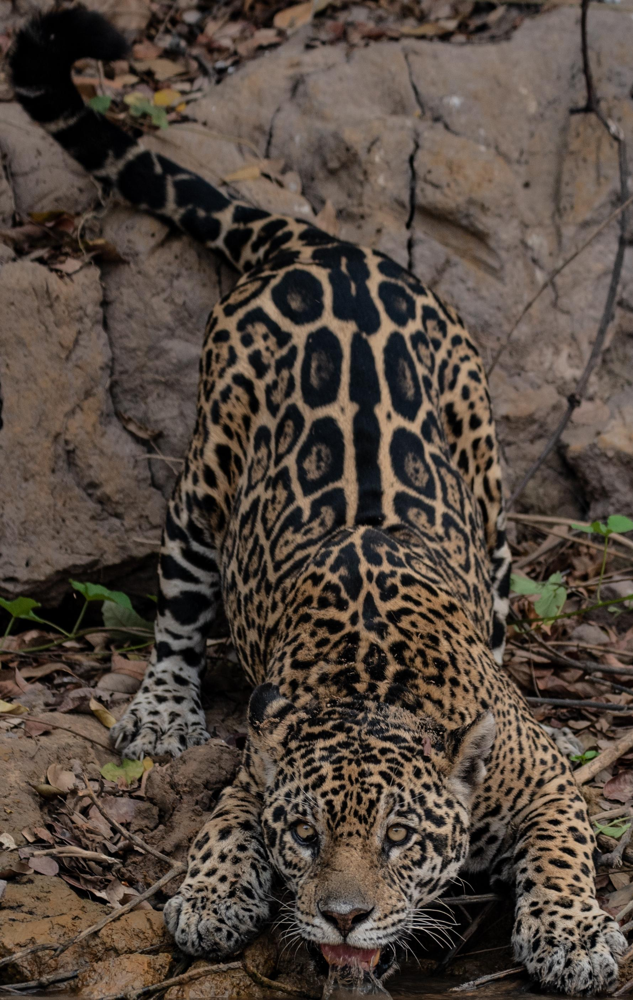

In [ ]:
dataset[-1]["image"]

In [ ]:
# create meteadata json in images
with open(Path("images/metadata.json"), "w") as f:
    json.dump(metadata, f)

In [ ]:
from huggingface_hub import login

from google.colab import userdata
token = userdata.get('HF_token')

login(token=token)  # Or set HF_TOKEN env var

In [ ]:
dataset.push_to_hub("shahabdaiani/jaguar_cropped_body")

Uploading the dataset shards:   0%|          | 0/5 [00:00<?, ?it/s]

Map:   0%|          | 0/620 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/7 [00:00<?, ?ba/s]

Map:   0%|          | 0/620 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/7 [00:00<?, ?ba/s]

Map:   0%|          | 0/620 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/7 [00:00<?, ?ba/s]

Map:   0%|          | 0/619 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/7 [00:00<?, ?ba/s]

Map:   0%|          | 0/619 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/7 [00:00<?, ?ba/s]

README.md:   0%|          | 0.00/354 [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/datasets/shahabdaiani/jaguar_cropped_body/commit/c13e536d2bf84f4c95adac1d7ae143128b247542', commit_message='Upload dataset', commit_description='', oid='c13e536d2bf84f4c95adac1d7ae143128b247542', pr_url=None, repo_url=RepoUrl('https://huggingface.co/datasets/shahabdaiani/jaguar_cropped_body', endpoint='https://huggingface.co', repo_type='dataset', repo_id='shahabdaiani/jaguar_cropped_body'), pr_revision=None, pr_num=None)

# Create and save test data

In [ ]:
import shutil
import os

base_path = project_path[user] / Path("images/cropped_body")
huggingFace = Path("images/test/cropped_body")


dataset =create_HF_dataset(df_hf_test , base_path,huggingFace )
metadata , path_dict = dataset.create_dataset()
copy_dict = dataset.copy_dict

file number was called


In [ ]:

# Copy files with progress bar
for src, dst in tqdm(copy_dict.items(), desc="Copying files", total=len(copy_dict)):
    os.makedirs(os.path.dirname(dst), exist_ok=True)
    shutil.copy(src, dst)

Copying files: 100%|██████████| 195/195 [01:14<00:00,  2.62it/s]


In [ ]:
# save metadata in test/ folder as matadata.json
with open(Path("images/test/metadata.json"), "w") as f:
    json.dump(metadata, f)


In [ ]:
from datasets import Dataset, DatasetDict, Features, ClassLabel, Value
import json
import pandas as pd
import datasets

# Add full image path
for sample in metadata:
    sample["image"] = os.path.join("images/test/cropped_body", sample["filename"])

# Convert to pandas then to Dataset
df = pd.DataFrame(metadata)
dataset = Dataset.from_pandas(df)

# Optionally cast columns
dataset = dataset.cast_column("image", datasets.Image())

# Test
print(dataset[0]["image"])


<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=3716x2165 at 0x7BA0CFBA6A50>


In [ ]:
dataset.push_to_hub("shahabdaiani/jaguar_cropped_body")

Uploading the dataset shards:   0%|          | 0/1 [00:00<?, ?it/s]

Map:   0%|          | 0/195 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/2 [00:00<?, ?ba/s]

README.md:   0%|          | 0.00/362 [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/datasets/shahabdaiani/jaguar_cropped_body/commit/3948d08fc0dbb555a697ec2216276c0ba67c50de', commit_message='Upload dataset', commit_description='', oid='3948d08fc0dbb555a697ec2216276c0ba67c50de', pr_url=None, repo_url=RepoUrl('https://huggingface.co/datasets/shahabdaiani/jaguar_cropped_body', endpoint='https://huggingface.co', repo_type='dataset', repo_id='shahabdaiani/jaguar_cropped_body'), pr_revision=None, pr_num=None)

In [ ]:
# upload the entire folder image to google drive
#



# Define paths
source_folder = 'images/'
destination_folder = project_path[user] / Path("dataset/cropped_body_with_test/")

# Copy the folder and all contents
shutil.copytree(source_folder, destination_folder)


PosixPath('/content/drive/MyDrive/DataScience/Jaguars_Project/dataset/cropped_body_with_test')

# copy all training data to hugging face

In [ ]:
!rm -rf images

In [ ]:
from tqdm import tqdm
folders = ["raw_images" , "cropped_body" , "cropped_head" , "segmented_body"]

for folder in folders :
  base_path = project_path[user] / Path(f"images/{folder}")
  huggingFace = Path(f"images/{folder}")


  dataset =create_HF_dataset(df_hf_train , base_path,huggingFace )
  metadata , path_dict = dataset.create_dataset()
  copy_dict = dataset.copy_dict

  print (f"Now copying data")
  # Copy files with progress bar
  for src, dst in tqdm(copy_dict.items(), desc="Copying files", total=len(copy_dict)):
      os.makedirs(os.path.dirname(dst), exist_ok=True)
      shutil.copy(src, dst)


file number was called
Now copying data


Copying files: 100%|██████████| 3098/3098 [33:44<00:00,  1.53it/s]


file number was called
Now copying data


Copying files: 100%|██████████| 3098/3098 [16:54<00:00,  3.05it/s]


file number was called
Now copying data


Copying files: 100%|██████████| 3098/3098 [18:21<00:00,  2.81it/s]


file number was called
Now copying data


Copying files: 100%|██████████| 3098/3098 [17:58<00:00,  2.87it/s]


In [ ]:
folders = ["raw_images" , "cropped_body" , "cropped_head" , "segmented_body"]
dataset_dict = {}



for folder in folders :

  print( f"I am working on {folder}")
  # copy data :


  base_path = project_path[user] / Path(f"images/{folder}")
  huggingFace = Path(f"images/{folder}")


  dataset =create_HF_dataset(df_hf_train , base_path,huggingFace )
  metadata , path_dict = dataset.create_dataset()
  copy_dict = dataset.copy_dict

  # Add full image paths
  for sample in metadata:
      sample["image"] = os.path.join(f"images/{folder}", sample["filename"])

  # Convert to HuggingFace Dataset
  df = pd.DataFrame(metadata)
  ds = Dataset.from_pandas(df)

  # Cast image column
  ds = ds.cast_column("image", datasets.Image())

  dataset_dict[folder] = ds

from datasets import DatasetDict

final_dataset = DatasetDict(dataset_dict)




I am working on raw_images
file number was called
I am working on cropped_body
file number was called
I am working on cropped_head
file number was called
I am working on segmented_body
file number was called


In [ ]:
from huggingface_hub import login

from google.colab import userdata
token = userdata.get('HF_token')

login(token=token)  # Or set HF_TOKEN env var

In [ ]:
final_dataset.push_to_hub("shahabdaiani/jaguaridentification")

Uploading the dataset shards:   0%|          | 0/70 [00:00<?, ?it/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/45 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/44 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Uploading the dataset shards:   0%|          | 0/5 [00:00<?, ?it/s]

Map:   0%|          | 0/620 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/7 [00:00<?, ?ba/s]

Map:   0%|          | 0/620 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/7 [00:00<?, ?ba/s]

Map:   0%|          | 0/620 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/7 [00:00<?, ?ba/s]

Map:   0%|          | 0/619 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/7 [00:00<?, ?ba/s]

Map:   0%|          | 0/619 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/7 [00:00<?, ?ba/s]

Uploading the dataset shards:   0%|          | 0/2 [00:00<?, ?it/s]

Map:   0%|          | 0/1549 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/16 [00:00<?, ?ba/s]

Map:   0%|          | 0/1549 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/16 [00:00<?, ?ba/s]

Uploading the dataset shards:   0%|          | 0/3 [00:00<?, ?it/s]

Map:   0%|          | 0/1033 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/11 [00:00<?, ?ba/s]

Map:   0%|          | 0/1033 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/11 [00:00<?, ?ba/s]

Map:   0%|          | 0/1032 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/11 [00:00<?, ?ba/s]

CommitInfo(commit_url='https://huggingface.co/datasets/shahabdaiani/jaguaridentification/commit/6c77b419eb6573e2eb440101eb6a871f20de7c27', commit_message='Upload dataset (part 00001-of-00002)', commit_description='', oid='6c77b419eb6573e2eb440101eb6a871f20de7c27', pr_url=None, repo_url=RepoUrl('https://huggingface.co/datasets/shahabdaiani/jaguaridentification', endpoint='https://huggingface.co', repo_type='dataset', repo_id='shahabdaiani/jaguaridentification'), pr_revision=None, pr_num=None)

In [ ]:
!ls images/raw_images/

00000.jpg  00443.jpg  00886.jpg  01329.jpg  01772.jpg  02215.jpg  02658.jpg
00001.jpg  00444.jpg  00887.jpg  01330.jpg  01773.jpg  02216.jpg  02659.jpg
00002.jpg  00445.jpg  00888.jpg  01331.jpg  01774.jpg  02217.jpg  02660.jpg
00003.jpg  00446.jpg  00889.jpg  01332.jpg  01775.jpg  02218.jpg  02661.jpg
00004.jpg  00447.jpg  00890.jpg  01333.jpg  01776.jpg  02219.jpg  02662.jpg
00005.jpg  00448.jpg  00891.jpg  01334.jpg  01777.jpg  02220.jpg  02663.jpg
00006.jpg  00449.jpg  00892.jpg  01335.jpg  01778.jpg  02221.jpg  02664.jpg
00007.jpg  00450.jpg  00893.jpg  01336.jpg  01779.jpg  02222.jpg  02665.jpg
00008.jpg  00451.jpg  00894.jpg  01337.jpg  01780.jpg  02223.jpg  02666.jpg
00009.jpg  00452.jpg  00895.jpg  01338.jpg  01781.jpg  02224.jpg  02667.jpg
00010.jpg  00453.jpg  00896.jpg  01339.jpg  01782.jpg  02225.jpg  02668.jpg
00011.jpg  00454.jpg  00897.jpg  01340.jpg  01783.jpg  02226.jpg  02669.jpg
00012.jpg  00455.jpg  00898.jpg  01341.jpg  01784.jpg  02227.jpg  02670.jpg
00013.jpg  0

In [ ]:
final_dataset

DatasetDict({
    raw_images: Dataset({
        features: ['filename', 'label', 'image'],
        num_rows: 3598
    })
    cropped_body: Dataset({
        features: ['filename', 'label', 'image'],
        num_rows: 3598
    })
    cropped_head: Dataset({
        features: ['filename', 'label', 'image'],
        num_rows: 3598
    })
    segmented_body: Dataset({
        features: ['filename', 'label', 'image'],
        num_rows: 3598
    })
})

In [ ]:
final_dataset["cropped_body"]

Dataset({
    features: ['filename', 'label', 'image'],
    num_rows: 3361
})

# create Kaggle data


use the already developed pipe line to create data


please use the df_hf_test to create files and metadata for test